In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import missingno as msno

#### Load training data

In [2]:
train_df = pd.read_csv('IMB 621 VMW SERVER CASE TRAINING DATA 28 MAY 2017.csv')

c:\users\harish\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2728: DtypeWarning: Columns (444,445,446,447,450,451,452,453,455,456,457,458,461,463,464,465,466,474,475,476,477,480,481,482,483,485,486,487,488,491,493,494,495,496,783) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
train_df.head(5)

,ID,flag,tot_page_views,tot_page_views_l30d,tot_page_views_l90d,tot_visits,tot_visits_l30d,tot_visits_l90d,log_in_events,internal_search_events,...,days_till_prodO_first_upcoming_contract_end_date,days_till_prodO_last_upcoming_contract_end_date,days_till_prodS_first_upcoming_contract_end_date,days_till_prodS_last_upcoming_contract_end_date,days_till_prodM_first_upcoming_contract_end_date,days_till_prodM_last_upcoming_contract_end_date,days_till_prodB_and_prodH_first_upcoming_contract_end_,days_till_prodB_and_prodH_last_upcoming_contract_end_d,days_till_prodY_first_upcoming_contract_end_date,days_till_prodY_last_upcoming_contract_end_date
0,631784,t,3,0,0,2,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,302014,t,1,0,0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1019521,t,1,0,0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17011,t,2,0,0,2,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,211815,t,1,0,0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
train_df.shape

(100000, 956)

In [5]:
train_new_df = train_df.copy()


In [6]:
train_new_df.shape

(100000, 956)

#### drop the columns with only one unique value

In [7]:
for col in train_new_df:
    if train_new_df[col].nunique()==1:
        train_new_df.drop(col,inplace=True,axis=1)
       

#### Check out the columns again

In [38]:
train_new_df.shape

(100000, 744)

In [31]:
train_new_df.to_csv('C:/Users/Harish/Desktop/BDA/Assignment_4/DATA SET/VMWareTrainingData.csv',header='true',index='false')

#### Loading modified dataset

In [2]:
# training_data = pd.read_csv('VMWareTrainingData.csv',encoding = "ISO-8859-1",index_col=False)

c:\users\harish\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2728: DtypeWarning: Columns (269,270,271,272,275,276,277,278,280,281,284,286,287,288,296,297,298,299,302,303,304,305,307,308,311,313,314,315,579) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [9]:
#training_data.reset_index(drop = True, inplace = True)
# training_dataN=training_data.copy()
# training_data = train_new_df.copy()
train_new_df.drop('ID',inplace=True,axis=1)

In [10]:
train_new_df.shape

(100000, 743)

In [5]:
#list(training_data)

In [6]:
# training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 744 entries, ID to days_till_prodY_last_upcoming_contract_end_date
dtypes: float64(460), int64(207), object(77)
memory usage: 567.6+ MB


#### find columns with NaN values

In [18]:
#train_new_df.columns[train_new_df.isnull().any()]
#train_new_df.columns[train_new_df.isnull().any()].tolist()

In [39]:
s = train_new_df.isnull().apply(sum, axis=0)

In [40]:
#type(s)
s.to_csv('C:/Users/Harish/Desktop/BDA/Assignment_4/DATA SET/NaNvalues.csv',header='true',index='false')

In [8]:
for col in train_new_df:
    if sum(train_new_df[col].isnull()) >=15000:
        train_new_df.drop(col, axis=1, inplace=True)


# for col in training_data: 
#     if s[col] == 100000:
#         training_data.drop(col,inplace=True,axis=1)

In [9]:
train_new_df.shape
# for col in training_data:
#     if training_data[col].isnull().sum()

(100000, 396)

# tran_new_df.replace([np.inf, -np.inf], np.nan)

#### Correlation between total page view/30/90 days

In [14]:
col_list_with_NaN_2 = ['tot_first_touch_paid_search_views',
'tot_first_touch_natural_search_views',
'tot_first_touch_cid_codes_views',
'tot_first_touch_src_codes_views',
'tot_first_touch_direct_views',
'tot_first_touch_internal_views',
'tot_first_touch_social_network_views',
'tot_first_touch_referring_domain_views',
'tot_last_touch_paid_search_views',
'tot_last_touch_natural_search_views',
'tot_last_touch_cid_codes_views',
'tot_last_touch_src_codes_views',
'tot_last_touch_direct_views',
'tot_last_touch_internal_views',
'tot_last_touch_social_network_views',
'tot_last_touch_referring_domain_views'
]

In [15]:
for col in col_list_with_NaN_2:
    train_new_df[col].fillna(0, inplace=True)

In [16]:
train_new_df.shape

(100000, 384)

In [16]:
train_new_df['ftr_dummy_geo_dunssiteAPACtoOTHER'].value_counts()

0    99999
1        1
Name: ftr_dummy_geo_dunssiteAPACtoOTHER, dtype: int64

#### Load Validation datset

In [41]:
valid_df =pd.read_csv('IMB 621 VMW SERVER CASE VALIDATION DATA 28 MAY 2017.csv')

c:\users\harish\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2728: DtypeWarning: Columns (444,445,446,447,450,451,452,453,455,456,458,461,463,464,465,468,470,474,475,476,477,480,481,482,483,485,486,488,491,493,494,495,498,500,768) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [42]:
# df= training_data.corr().abs()
validation_df = valid_df.copy()

In [43]:
# type(df)
validation_df.shape

(49999, 956)

In [44]:
for col in validation_df:
    if validation_df[col].nunique()==1:
        validation_df.drop(col,inplace=True,axis=1)

In [45]:
validation_df.shape

(49999, 721)

In [23]:
for col in validation_df:
    if sum(validation_df[col].isnull()) >=40000:
        validation_df.drop(col, axis=1, inplace=True)

In [27]:
validation_df.shape

(49999, 412)

In [28]:
train_new_df.columns.tolist()

['tot_page_views',
 'tot_page_views_l30d',
 'tot_page_views_l90d',
 'tot_visits',
 'tot_visits_l30d',
 'tot_visits_l90d',
 'internal_search_events',
 'buy_now_events',
 'download_trial_events',
 'support_search_events',
 'get_pricing_events',
 'product_view_events',
 'campaign_view_events',
 'purchase_events',
 'paid_search_events',
 'natural_search_events',
 'tot_campaign_visits',
 'tot_paid_search_visits',
 'tot_google_browser_visits',
 'tot_mozilla_browser_visits',
 'tot_microsoft_browser_visits',
 'tot_apple_browser_visits',
 'tot_opera_browser_visits',
 'tot_other_browser_visits',
 'tot_internal_ref_visits',
 'tot_search_engine_ref_visits',
 'tot_email_ref_visits',
 'tot_social_media_ref_visits',
 'tot_other_ref_visits',
 'tot_prodQ_os_visits',
 'tot_android_visits',
 'tot_ios_visits',
 'tot_winphone_visits',
 'tot_blackberry_visits',
 'tot_windows_visits',
 'tot_linux_visits',
 'tot_osx_visits',
 'tot_google_se_visits',
 'tot_yahoo_se_visits',
 'tot_baidu_se_visits',
 'tot_msn_se

In [26]:
validation_df.columns.tolist()

['ID',
 'tot_page_views',
 'tot_page_views_l30d',
 'tot_page_views_l90d',
 'tot_visits',
 'tot_visits_l30d',
 'tot_visits_l90d',
 'log_in_events',
 'internal_search_events',
 'buy_now_events',
 'download_trial_events',
 'support_search_events',
 'product_view_events',
 'cart_add_events',
 'campaign_view_events',
 'purchase_events',
 'paid_search_events',
 'natural_search_events',
 'tot_campaign_visits',
 'tot_paid_search_visits',
 'tot_google_browser_visits',
 'tot_mozilla_browser_visits',
 'tot_microsoft_browser_visits',
 'tot_apple_browser_visits',
 'tot_opera_browser_visits',
 'tot_other_browser_visits',
 'tot_internal_ref_visits',
 'tot_search_engine_ref_visits',
 'tot_email_ref_visits',
 'tot_social_media_ref_visits',
 'tot_other_ref_visits',
 'tot_prodQ_os_visits',
 'tot_android_visits',
 'tot_ios_visits',
 'tot_winphone_visits',
 'tot_blackberry_visits',
 'tot_windows_visits',
 'tot_linux_visits',
 'tot_osx_visits',
 'tot_google_se_visits',
 'tot_yahoo_se_visits',
 'tot_baidu_se

In [33]:
validation_df['total_employees'].value_counts()

1.0         3847
0.0         3151
2.0         2701
3.0         1187
4.0          612
5.0          559
7.0          458
10.0         301
6.0          284
20.0         177
8.0          171
15.0         154
9.0          147
50.0         126
100.0        119
12.0         119
30.0         109
9300.0        98
11.0          95
25.0          92
200.0         82
40.0          80
35.0          76
80.0          74
60.0          66
16.0          65
13.0          63
300.0         57
14.0          54
45.0          51
            ... 
2494.0         1
10200.0        1
6409.0         1
404.0          1
3470.0         1
18112.0        1
8486.0         1
2191.0         1
361.0          1
1357.0         1
667.0          1
5392.0         1
190000.0       1
21700.0        1
174.0          1
1767.0         1
10846.0        1
670.0          1
972.0          1
1483.0         1
316.0          1
613.0          1
379.0          1
47400.0        1
1225.0         1
2705.0         1
5300.0         1
396.0         

In [22]:

indices = np.where(df > abs(0.5))
indices = [(df.columns[x], df.columns[y]) for x, y in zip(*indices)
                                         if x != y and x < y]

In [23]:
indices

[('tot_page_views', 'tot_page_views_l30d'),
 ('tot_page_views', 'tot_page_views_l90d'),
 ('tot_page_views', 'tot_visits'),
 ('tot_page_views', 'tot_visits_l30d'),
 ('tot_page_views', 'tot_visits_l90d'),
 ('tot_page_views', 'natural_search_events'),
 ('tot_page_views', 'tot_google_browser_visits'),
 ('tot_page_views', 'tot_mozilla_browser_visits'),
 ('tot_page_views', 'tot_microsoft_browser_visits'),
 ('tot_page_views', 'tot_internal_ref_visits'),
 ('tot_page_views', 'tot_search_engine_ref_visits'),
 ('tot_page_views', 'tot_other_ref_visits'),
 ('tot_page_views', 'tot_windows_visits'),
 ('tot_page_views', 'tot_google_se_visits'),
 ('tot_page_views', 'tot_first_touch_natural_search_views'),
 ('tot_page_views', 'tot_first_touch_direct_views'),
 ('tot_page_views', 'tot_last_touch_natural_search_views'),
 ('tot_page_views', 'tot_last_touch_direct_views'),
 ('tot_page_views', 'tot_last_touch_internal_views'),
 ('tot_page_views', 'tot_last_touch_referring_domain_views'),
 ('tot_page_views', '

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002344068E8D0>]], dtype=object)

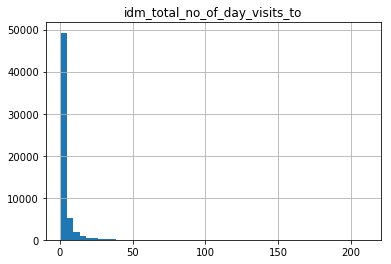

In [39]:
train_new_df.hist(column='idm_total_no_of_day_visits_to',bins=50)

In [41]:
train_new_df['idm_total_no_of_day_visits_to'].median()

2.0

In [42]:
train_new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 416 entries, ID to ftr_growth_prodA_ent_plus_14_15
dtypes: float64(191), int64(207), object(18)
memory usage: 317.4+ MB


In [47]:
type(train_new_df['db_city'][0])

str

In [24]:
# for col in train_new_df:
#     if train_new_df[col].apply(type)=='str':
#         print(col)

In [13]:
[key for key in dict(train_new_df.dtypes) if dict(train_new_df.dtypes)[key] in ['object']]

[]

In [11]:
train_new_df.drop(['geo_dunssite',
                   'db_audience',
 'gu_emp_segment_desc',
                   'first_any_product_purch_date',
 'first_prodG_purchase_date',
 'last_any_product_purchase_date',
 'last_prodG_purchase_date',
 'idc_verticals',
 'citdb_ent_server',
 'citdb_ent_it_budget',
 'record_type','db_industry'],axis=1,inplace=True)

In [12]:
train_new_df['prodV_booking_pct'] = train_new_df['prodV_booking_pct'].apply(pd.to_numeric, errors='coerce')

In [14]:
temp_list = ['db_industry',
 'db_country',
 'db_audience',
 'first_any_product_purch_date',
 'first_prodG_purchase_date',
 'last_any_product_purchase_date',
 'last_prodG_purchase_date',
 'geo_dunssite',
 'gu_emp_segment_desc',
 'idc_verticals',
 'citdb_ent_server',
 'citdb_ent_it_budget',
 'record_type',
 'prodV_booking_pct']

In [27]:
train_numeric = train_new_df.copy()

In [28]:
for col in train_numeric:
    if col in temp_list:
        train_numeric.drop(col,axis=1,inplace=True)

In [30]:
train_numeric.shape
train_numeric.drop('ID',inplace=True,axis=1)

Using TensorFlow backend.


In [32]:
X = train_numeric.loc[:, train_numeric.columns != 'train_period_workstation_purchase_flag']
Y = train_numeric.loc[:,'train_period_workstation_purchase_flag']

In [55]:
train_new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 397 entries, ID to ftr_growth_prodA_ent_plus_14_15
dtypes: float64(176), int64(207), object(14)
memory usage: 302.9+ MB


#### Visualize missing value

In [17]:
train_new_df.drop(['db_audience'],axis=1,inplace=True)

In [18]:
train_new_df.drop([ 'first_any_product_purch_date',
 'first_prodG_purchase_date',
 'last_any_product_purchase_date',
 'last_prodG_purchase_date',],axis=1,inplace=True)

In [16]:
# for col in col_list_with_NaN_2:
#     if sum(train_new_df[col].isnull()) == 2:
#         train_new_df[col].fillna(0, inplace=True)

In [19]:
train_new_df.shape

(100000, 391)

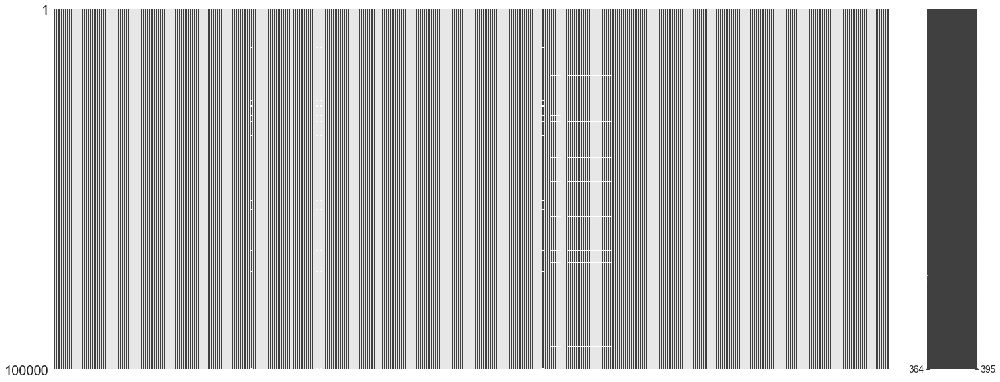

In [17]:
msno.matrix(train_new_df)

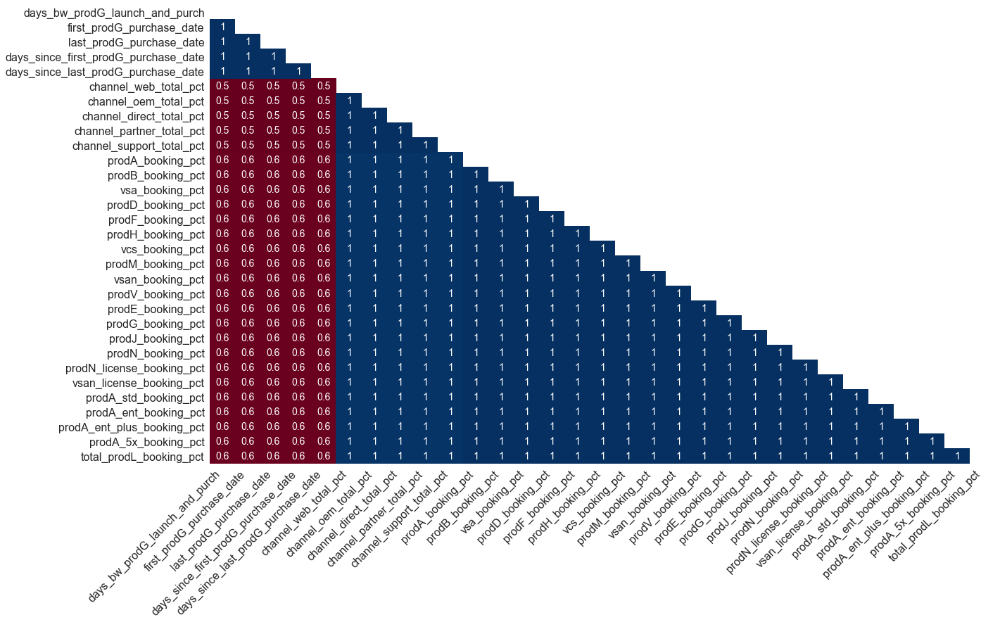

In [18]:
msno.heatmap(train_new_df)

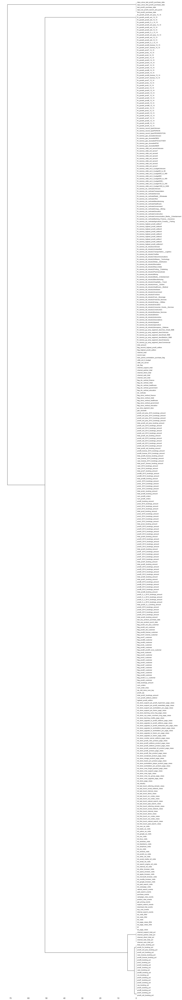

In [21]:
msno.dendrogram(train_new_df)

In [20]:
import pandas_profiling as pdp
pdp.ProfileReport(train_new_df)

c:\users\harish\anaconda3\lib\site-packages\matplotlib\__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Number of variables,395
Number of observations,100000
Total Missing (%),0.2%
Total size in memory,301.4 MiB
Average record size in memory,3.1 KiB
Numeric,150
Categorical,11
Boolean,104
Date,0
Text (Unique),0
Rejected,129


In [ ]:
NaN_list = []

In [17]:
for col in train_new_df:
    if sum(train_new_df[col].isnull()) > 0:
        print(col)
        #train_new_df[col].fillna(train_new_df[col].median(), inplace=True)

days_bw_prodG_launch_and_purch
days_since_first_prodG_purchase_date
days_since_last_prodG_purchase_date
channel_web_total_pct
channel_oem_total_pct
channel_direct_total_pct
channel_partner_total_pct
channel_support_total_pct
prodA_booking_pct
prodB_booking_pct
vsa_booking_pct
prodD_booking_pct
prodF_booking_pct
prodH_booking_pct
vcs_booking_pct
prodM_booking_pct
vsan_booking_pct
prodV_booking_pct
prodE_booking_pct
prodG_booking_pct
prodJ_booking_pct
prodN_booking_pct
prodN_license_booking_pct
vsan_license_booking_pct
prodA_std_booking_pct
prodA_ent_booking_pct
prodA_ent_plus_booking_pct
prodA_5x_booking_pct
total_prodL_booking_pct


In [18]:
NaN_list=['days_bw_prodG_launch_and_purch',
'days_since_first_prodG_purchase_date',
'days_since_last_prodG_purchase_date',
'channel_web_total_pct',
'channel_oem_total_pct',
'channel_direct_total_pct',
'channel_partner_total_pct',
'channel_support_total_pct',
'prodA_booking_pct',
'prodB_booking_pct',
'vsa_booking_pct',
'prodD_booking_pct',
'prodF_booking_pct',
'prodH_booking_pct',
'vcs_booking_pct',
'prodM_booking_pct',
'vsan_booking_pct',
'prodV_booking_pct',
'prodE_booking_pct',
'prodG_booking_pct',
'prodJ_booking_pct',
'prodN_booking_pct',
'prodN_license_booking_pct',
'vsan_license_booking_pct',
'prodA_std_booking_pct',
'prodA_ent_booking_pct',
'prodA_ent_plus_booking_pct',
'prodA_5x_booking_pct',
'total_prodL_booking_pct',]

In [21]:
train_new_df['prodV_booking_pct'] = train_new_df['prodV_booking_pct'].apply(pd.to_numeric, errors='coerce')

In [19]:
for col in NaN_list:
    train_new_df[col].fillna(train_new_df[col].median(), inplace=True)
    

In [60]:
train_new_df['prodV_booking_pct'].fillna(train_new_df['prodV_booking_pct'].median(), inplace=True)

In [20]:
# train_new_df.replace([np.inf, -np.inf], np.nan)

In [63]:


with pd.option_context('mode.use_inf_as_null', True):
    train_new_df = train_new_df.dropna(how='all')

In [30]:
train_new_df.isnull().any().any()
train_new_df.shape

(99999, 384)

In [29]:
with pd.option_context('mode.use_inf_as_null', True):
    train_new_df = train_new_df.dropna()

In [36]:
train_new_df= train_new_df.astype(np.float64)

In [30]:
[key for key in dict(train_new_df.dtypes) if dict(train_new_df.dtypes)[key] in ['object']]

['db_industry',
 'geo_dunssite',
 'gu_emp_segment_desc',
 'idc_verticals',
 'citdb_ent_server',
 'citdb_ent_it_budget',
 'record_type']

In [31]:
train_new_df.drop(['db_industry',
 'geo_dunssite',
 'gu_emp_segment_desc',
 'idc_verticals',
 'citdb_ent_server',
 'citdb_ent_it_budget',
 'record_type'],axis=1,inplace=True)

In [75]:
train_new_df.isnull().any().any()

False

In [37]:
train_new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 384 entries, ID to ftr_growth_prodA_ent_plus_14_15
dtypes: float64(384)
memory usage: 293.0 MB


In [95]:
# mode =train_new_df['last_prodG_purchase_date'].mode()
training_df= train_new_df.copy()
train_new_df.drop('ID',axis=1,inplace=True)

#### Drop all the NaN and Inf values

In [67]:
np.isfinite(X).all().all()

True

In [46]:
with pd.option_context('mode.use_inf_as_null', True):
    train_new_df = train_new_df.dropna()

In [100]:
X=train_new_df[columns]
y =train_new_df.loc[:,'train_period_workstation_purchase_flag']

In [101]:
X = X.as_matrix()
y = y.as_matrix()

In [86]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[28878    37]
 [ 1061    24]]


In [87]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

        0.0       0.96      1.00      0.98     28915
        1.0       0.39      0.02      0.04      1085

avg / total       0.94      0.96      0.95     30000



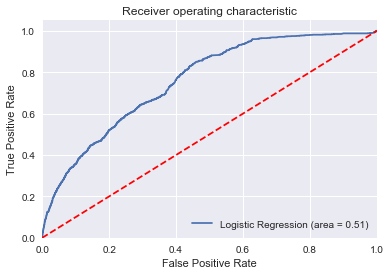

In [88]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()